In [1]:
import ROOT
import sys
import numpy as np
import array
from math import sqrt, fabs, sin, exp, log10
from ROOT import TFile, TTree, TChain, TBranch, TH1D, TH1I, TH1F, TH2F, Math
from ROOT import TLorentzVector
from ROOT.Math import LorentzVector, VectorUtil
import matplotlib.pyplot as plt
import matplotlib
import plotly
import plotly.graph_objs as go
plotly.offline.init_notebook_mode()

Warning in <TInterpreter::ReadRootmapFile>: class  edm4hep::ObjectID found in libedm4hepDict.so  is already in libedm4drDict.so 


Welcome to JupyROOT 6.28/10


In [2]:
# For 1 event

def getBarrelEndcapHits(f):
    BEhits_array = []

    for entry in f.events:
        for BEhit in entry.SCEPCAL_BE_readout:
            BEhits_array.append(BEhit)  
    
    BEhits = np.array(BEhits_array)
    BE_x = np.array([hit.position.x for hit in BEhits])
    BE_y = np.array([hit.position.y for hit in BEhits])
    BE_z = np.array([hit.position.z for hit in BEhits])
    BE_E = np.array([hit.energy for hit in BEhits])
    BE_cID = np.array([hit.cellID for hit in BEhits])
    
    return BEhits, BE_x, BE_y, BE_z, BE_E, BE_cID

def getTimingLayerHits(f):
    TLhits_array = []
    
    for entry in f.events:
        for TLhit in entry.SCEPCAL_TL_readout:
            TLhits_array.append(TLhit)
    
    TLhits = np.array(TLhits_array)
    TL_x = np.array([hit.position.x for hit in TLhits])
    TL_y = np.array([hit.position.y for hit in TLhits])
    TL_z = np.array([hit.position.z for hit in TLhits])
    TL_E = np.array([hit.energy for hit in TLhits])
    TL_cID = np.array([hit.cellID for hit in TLhits])

    return TLhits, TL_x, TL_y, TL_z, TL_E, TL_cID


BE hits: 39588
E sum: 138.07151664711455
E min: 2.3391412504875086e-12
E max: 10.928560256958008


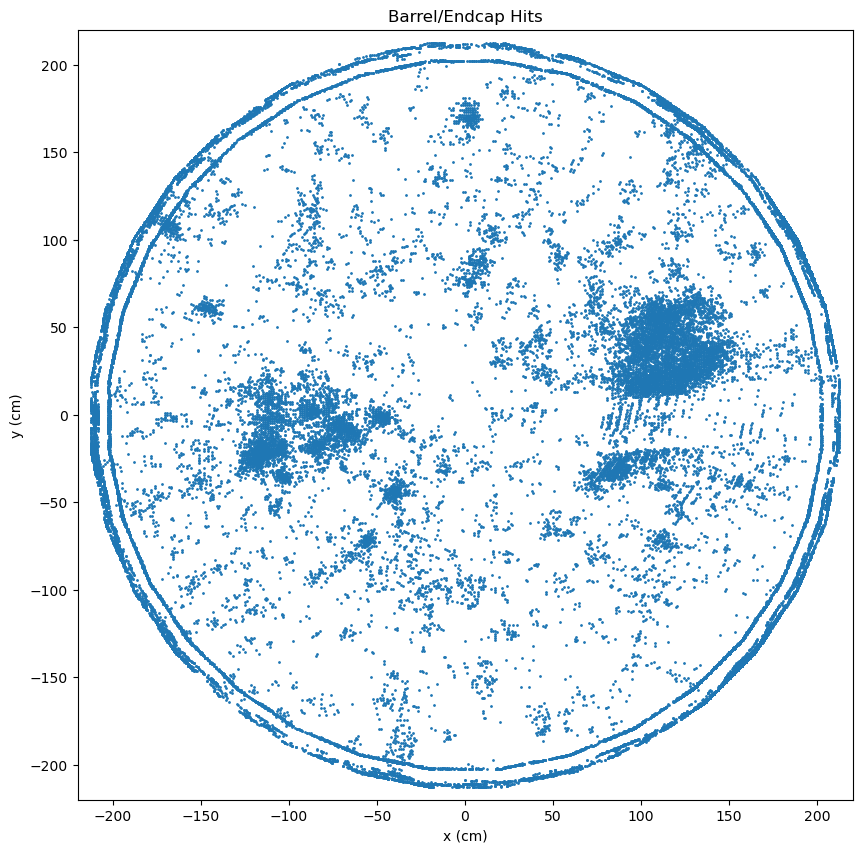

In [3]:
f = TFile.Open('wzp6_ee_ZZ_test_ecm240_n1_cut0_BEonly.root')

BEhits, BE_x, BE_y, BE_z, BE_E, BE_cID = getBarrelEndcapHits(f)
# TLhits, TL_x, TL_y, TL_z, TL_E, TL_cID = getTimingLayerHits(f)

print('BE hits:', len(BE_E))
print('E sum:', BE_E.sum())
print('E min:', BE_E.min())
print('E max:', BE_E.max())

# print('TL hits:', len(TL_E))
# print('E sum:', TL_E.sum())
# print('E min:', TL_E.min())
# print('E max:', TL_E.max())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot()

ax.scatter(BE_x, BE_y, s=1)
# ax.scatter(TL_x, TL_y, s=50, marker='x')

ax.set_xlim(-220,220)
ax.set_ylim(-220,220)
ax.set_title('Barrel/Endcap Hits')
ax.set_xlabel('x (cm)')
ax.set_ylabel('y (cm)')
plt.show()

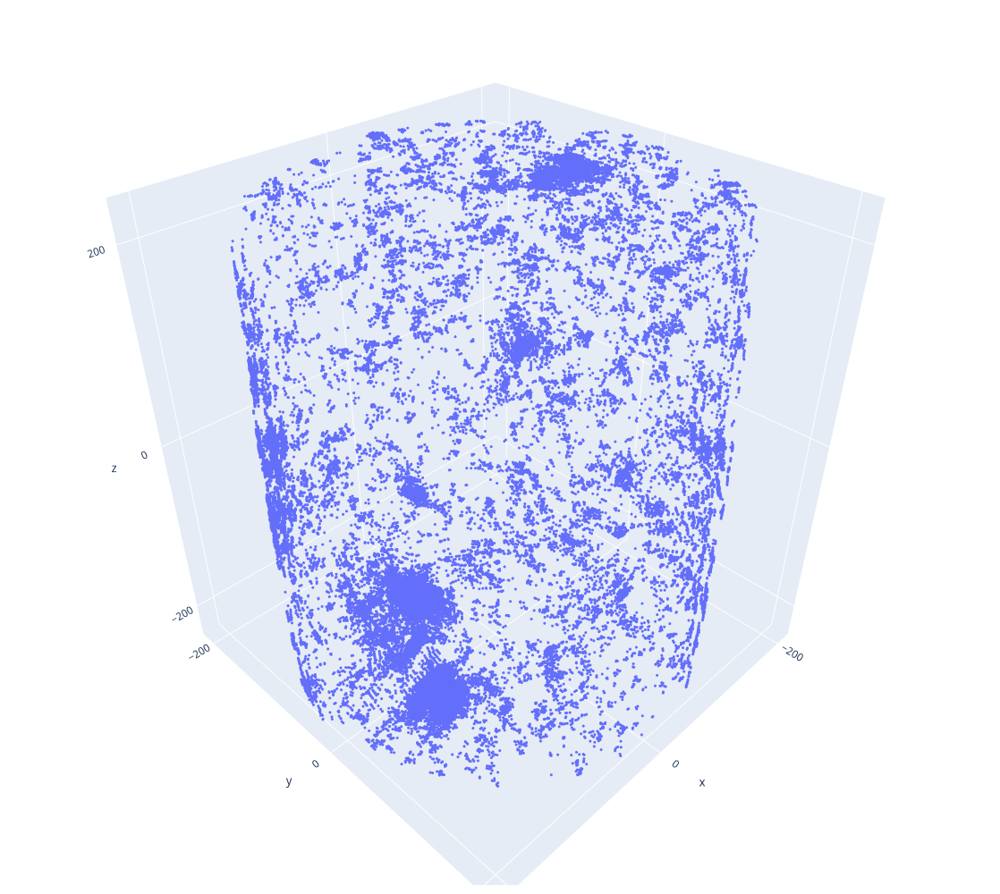

In [4]:
# 3d plots

trace = go.Scatter3d(
    x= BE_x,
    y= BE_y,
    z= BE_z,
    mode='markers',
    marker={
        'size': 1,
        'opacity': 1,
    }
)

layout = go.Layout(
    autosize=False,
    width=1000,
    height=1000,
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

fig = go.Figure(data=data, layout=layout)

fig.update_layout(
    scene = dict(
                xaxis = dict(nticks=4, range=[-220,220],),
                yaxis = dict(nticks=4, range=[-220,220],),
                zaxis = dict(nticks=4, range=[-240,240],),
            ),
            width=700,
            margin=dict(r=20, l=10, b=10, t=10)
)

plotly.offline.iplot(fig)